# Generate Music Videos using Stable Diffusion with 🤗 Diffusers

In order for this to run, you need an Excel file of a defined format, such as "NoMoreHeroes.xlsx"
    This provides meta data
   And the timing of prompts
   Plus any desired target images to appear at defined times
     and Shadow images
 You also need a subdirectory of your paty called ImageLibrary 
     This is where you story your target and shadow images    
Execute with this command
movie = makeVideo('WaveCafe.xlsx')

## Using Stable Diffusion

To run Stable Diffusion on your computer you have to accept the model license. It's an open CreativeML OpenRail-M license that claims no rights on the outputs you generate and prohibits you from deliberately producing illegal or harmful content. The [model card](https://huggingface.co/CompVis/stable-diffusion-v1-4) provides more details. If you do accept the license, you need to be a registered user in 🤗 Hugging Face Hub and use an access token for the code to work. You have two options to provide your access token:

* Use the `huggingface-cli login` command-line tool in your terminal and paste your token when prompted. It will be saved in a file in your computer.
* Or use `notebook_login()` in a notebook, which does the same thing.



In [1]:
import sys
from pathlib import Path


if 'google.colab' in sys.modules:
    !pip install -Uq diffusers transformers fastcore
    from google.colab import drive
    drive.mount('/content/drive')
    path = Path('drive/MyDrive/Colab Notebooks')
    device = 'cuda'    
else:
    path = Path('.')
    device = 'mps'

In [2]:
import logging
#from os import ST_WRITE
#from turtle import onclick

#import matplotlib.pyplot as plt
import torch
from diffusers import StableDiffusionPipeline
#from fastcore.all import concat
from huggingface_hub import notebook_login
from PIL import Image
import numpy as np
logging.disable(logging.WARNING)

#torch.manual_seed(1)
if not (Path.home()/'.huggingface'/'token').exists(): notebook_login()

from diffusers import StableDiffusionImg2ImgPipeline
#from fastdownload import FastDownload    
    
from fastai.vision.augment import CropPad   
from IPython.display import Image as xImage,Video
import pickle
from tqdm import tqdm
import cv2
import pandas as pd


In [3]:
modelID = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(modelID,revision="fp16",torch_dtype=torch.float16).to(device)


/Users/Gavin/mambaforge/envs/fastbook/lib/python3.9/site-packages/transformers/models/clip/feature_extraction_clip.py:28: FutureWarning: The class CLIPFeatureExtractor is deprecated and will be removed in version 5 of Transformers. Please use CLIPImageProcessor instead.
  warnings.warn(


## Try animating a story
Specify a series of prompts and the number of frames to generate. The duration of each frame is set at 50ms, when the images are saved to a GIF. The GIF is automatically saved to your Google Drive.


In [4]:
#prompts = [['a wide street in a rural french town, summer', 25],
#           [ "a treelined avenue, poplars, summer day, france",50],
#           ["a road by the sea, trees on the right, summer day, france",50],
#           ['a road going up a mountain, summer day, france',50],
#           ['a road descending a mountain, summer day, france',25],
#           ['a road in the countryside, fields of sunflowers, summer day, france',25],
#           ['a narrow road through a medieval french town, summer',25]
#           ]
 

Generate movie

In [5]:


def zoomIn(im,scale = 0.97):
    size = im.size[0]
    return im.crop_pad(int(size*scale)).resize((size,size))


def insert(im0,im1,prompt,steps=4):
    "Insert img2img steps between existing frames to obtain a smoother transition"
    im = im0
    ims = [im]
    for i in range(1,steps):
        im = Image.fromarray(((1-i/steps)*np.array(im0)+i/steps*np.array(im1)).astype(np.uint8))
        im2 = pipe(prompt=prompt, num_images_per_prompt=1, image=im, strength=0.6, guidance_scale=7, num_inference_steps=50).images[0]
        if max(max(im2.getextrema()))>0:
            im=im2
            ims += [im]
    return ims

def insertMovie(movie,prompts,style,steps=5):
    """Extend movie using fuction f(either insert or fade)
    This either inserts new images between existing frames or fades bewteen them"""
    n = len(movie)
    promptList = sum([[' '.join([prompt,style])]*i for prompt,i in prompts],[])*2
    expIms = []  
    for i in tqdm(range(n)):
        expIms += insert(movie[i],movie[(i+1)%n],promptList[i],steps)
    return expIms


def fade(im0,im1,steps=20):
    """Fade from one image to another"""
    return [Image.fromarray(((1-i/steps)*np.array(im0)+i/steps*np.array(im1)).astype(np.uint8)) for i in range(steps)]

def fadeMovie(movie,steps=5):
    """Extend movie using fuction f(either insert or fade)
    This either inserts new images between existing frames or fades bewteen them"""
    n = len(movie)
    expIms = []  
    for i in range(n):
        expIms += fade(movie[i],movie[(i+1)%n],steps)
    return expIms


def makeMovie(prompts, style='', negative_prompt='',scale = (512-4)/512,mix_factor=0.01,nInsert=4,nFade=10,strength=0.5,guidance_scale=7,num_inference_steps=50):
    """Generates a movie based on prompts, style, negative prompts and zoom scale
    mix_factor retains a percentage of the initial image throughout animation
    nInsert adds frames between the key frames
    nFade adds frames to smooth the transition between frames in final animation
    remaining parameters control the Img2Img pipe"""
    # Create an initial image then iterate
    print('Generating first image')
    pipe1 = StableDiffusionPipeline.from_pretrained(modelID,revision="fp16", torch_dtype=torch.float16).to(device)
    im1 = pipe1(' '.join([prompts[0][0],style])).images[0]
    del pipe1
    #black = max(max(im1.getextrema()))==0
    im = im1
    movie = [im]
    display(im)
    if max(max(im1.getextrema()))==0:
        print('Initial image failed')
    else:
        print('Preparing animation')
        pipe = StableDiffusionImg2ImgPipeline.from_pretrained("CompVis/stable-diffusion-v1-4",revision="fp16",torch_dtype=torch.float16).to(device)
        for prompt,frames in prompts:
            prompt = ' '.join([prompt,style])
            for i in range(frames):
                im = zoomIn(im,scale)
                im2 = pipe(prompt, num_images_per_prompt=1, image=im, negative_prompt=negative_prompt,strength=strength, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images[0]
                if max(max(im2.getextrema()))>0:
                    print(i,prompt)
                    im = Image.fromarray(((1-mix_factor*i)*np.array(im2)+mix_factor*i*np.array(im1)).astype(np.uint8))
                movie += [im]
            display(im)
    return movie


def saveVideo(fn,movie,fps=20,width=512,height=512):
    """Gemnerate mp4""" 
    fourcc = cv2.VideoWriter_fourcc(*'MP4V')
    video = cv2.VideoWriter(f'{fn}.mp4', fourcc, fps, (width,height))
    for image in movie:
        video.write(cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR))
    cv2.destroyAllWindows()
    video.release()


def create(fn,prompts,style='',negative_prompt='',zoom=True,nInsert=0,nFade=20):
    scale = (512-4)/512 if zoom else 1
    movie = makeMovie(prompts, style, negative_prompt,scale,mix_factor=0.01,nInsert=nInsert,nFade=nFade,strength=0.5,guidance_scale=7,num_inference_steps=50)
    saveVideo(f'{fn}_Keyframes',movie)
    # These steps make make the movie much smoother, but also make it nInsert*nFade times longer
    print(f'{len(movie)} key frames created... extending movie')
    movie = insertMovie(movie,prompts,style,nInsert)
    saveVideo(f'{fn}_Insert{nInsert}',movie)
    print('Smoothing frame transition')
    movie = fadeMovie(movie,nFade)
    saveVideo(f'{fn}_Insert{nInsert}_Fade{nFade}',movie)
    #movie[0].save(path/f'{fn}.gif', format='GIF', append_images=movie[1:], save_all=True, duration=75, loop=0)
    with open(path/f'{fn}_Insert{nInsert}.pkl','wb') as f: 
        pickle.dump(movie,f)
    return movie

In [6]:
def loadController(fn = 'WaveCafe.xlsx', fps = 20):
    """Load an Excel movie controller file and return output"""
    metaData = pd.read_excel(path/fn,header=None,nrows=4).set_index(0)[1]
    dfPrompts = pd.read_excel(path/fn,skiprows=4)
    dfPrompts['TargetImage'] = dfPrompts.Image.shift(-1)
    dfPrompts['Seconds'] = pd.to_timedelta(dfPrompts['Time'].astype(str)).diff().dt.total_seconds().shift(-1)
    # Drop last line
    dfPrompts = dfPrompts[:-1]
    dfPrompts['NegativePrompt'].fillna('',inplace=True)
    dfPrompts['Frames'] =  (dfPrompts['Seconds'] // metaData.SecondsPerFrame).astype(int)
    dfPrompts.loc[0,'Frames'] -= 1
    dfPrompts['nFades'] = (round(dfPrompts['Seconds'] / dfPrompts['Frames'] * fps,0)).astype(int)
    #dfPrompts['StepFunc'] = dfPrompts.TargetImage.apply(lambda x: 'evolve' if pd.isnull(x) else 'insert')
    dfPrompts['Prompt2Use'] = dfPrompts.apply(lambda x: ' '.join([x.Prompt,metaData.Style]) if pd.isnull(x.PromptStyle) else ' '.join([x.Prompt,x.PromptStyle]),axis=1)    
    return metaData, dfPrompts


def generateInitialImage(prompt,modelID=modelID):
    pipe1 = StableDiffusionPipeline.from_pretrained(modelID,revision="fp16", torch_dtype=torch.float16).to(device)
    im1 = pipe1(prompt).images[0]
    del pipe1
    return im1

def getImage(imFile):
        return Image.open(path/f'ImageLibrary/{imFile}').resize((512,512))

def controlledCreate(metaData, dfPrompts, shadFactor = 0.01, fps = 20, strength=0.5,guidance_scale=7,num_inference_steps=50):
    """Load Excel movie controller and generate movie"""
    scale = (512-4)/512 if metaData.Zoom else 1
    movie = []
    print('Preparing initial image...')
    imFile = dfPrompts.loc[0,'Image']
    if (path/f"ImageLibrary/{imFile}").is_file():
        im1 = getImage(imFile)
    else:
        im1 = generateInitialImage(dfPrompts.loc[0,'Prompt2Use'])
    im = im1
    if max(max(im1.getextrema()))==0:
        print('Initial image failed')
    else:
        print('Creating key frames...')
        movie += [im]
        for i,row in dfPrompts.iterrows():
            print(row.Prompt2Use,i)
            # Insert current frame image if it exists
            if (path/f'ImageLibrary/{row.Image}').is_file():
                im = getImage(row.Image)
                movie[-1] = im
            # Update persistent shadow image if required
            shadow = im1 if not (path/f'ImageLibrary/{row.ShadowImage}').is_file() else getImage(row.ShadowImage)
            # Update target image if required
            target = im if not (path/f'ImageLibrary/{row.TargetImage}').is_file() else getImage(row.TargetImage)

            for j in range(row.Frames):
                im = Image.fromarray(((1-shadFactor)*np.array(im)+shadFactor*np.array(shadow)).astype(np.uint8))
                if not pd.isnull(row.TargetImage):
                    im = Image.fromarray(((1-j/row.Frames)*np.array(im)+j/row.Frames*np.array(target)).astype(np.uint8))
                im2 = pipe(row.Prompt2Use, num_images_per_prompt=1, image=im, negative_prompt=row.NegativePrompt,strength=strength, guidance_scale=guidance_scale, num_inference_steps=num_inference_steps).images[0]
                if max(max(im2.getextrema()))>0:
                    print(j,row.Prompt2Use)
                    im = im2
                movie += [im]
            display(im)
        movie += [target] if (path/f'ImageLibrary/{row.TargetImage}').is_file() else [im1]
    return movie

def controlledFadeMovie(movie, metaData, dfPrompts):
    extMovie = []
    frame = 0
    for i,row in dfPrompts.iterrows():
        for j in range(row.Frames):
            extMovie += fade(movie[frame],movie[frame+1],row.nFades)
            frame += 1
    extMovie += fade(movie[frame],movie[frame+1],row.nFades)
    return extMovie

def saveMovie(fn,movie):
    with open(f'{fn}_KeyFrames.pkl','wb') as f: 
        pickle.dump(movie,f)
    
def makeVideo(fn='WaveCafe.xlsx',fps=20):
    metaData, dfPrompts = loadController(fn, fps)
    movie = controlledCreate(metaData, dfPrompts, shadFactor = 0.01, fps = fps, strength=0.5,guidance_scale=7,num_inference_steps=50)
    fnSave = str(path/f"{metaData.Title}_{pd.Timestamp.now().strftime('%Y-%m-%d %X')}".replace(' ','_'))
    saveMovie(fnSave,movie)
    movie = controlledFadeMovie(movie, metaData, dfPrompts)
    saveVideo(fnSave,movie)
    #movie[0].save(path/f'{fn}.gif', format='GIF', append_images=movie[1:], save_all=True, duration=75, loop=0)
    return movie
    

Preparing initial image...
Creating key frames...
Wasteland Dali surrealist 0


  0%|          | 0/25 [00:00<?, ?it/s]

0 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

2 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

4 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

6 Wasteland Dali surrealist


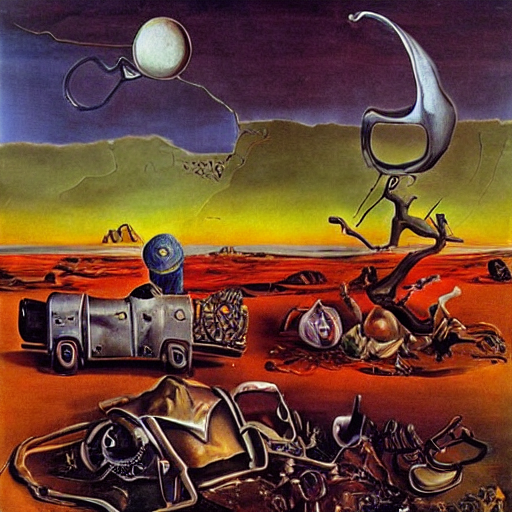

the sun went down on a barren on town, just a grave of degradation Dali surrealist 1


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 the sun went down on a barren on town, just a grave of degradation Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

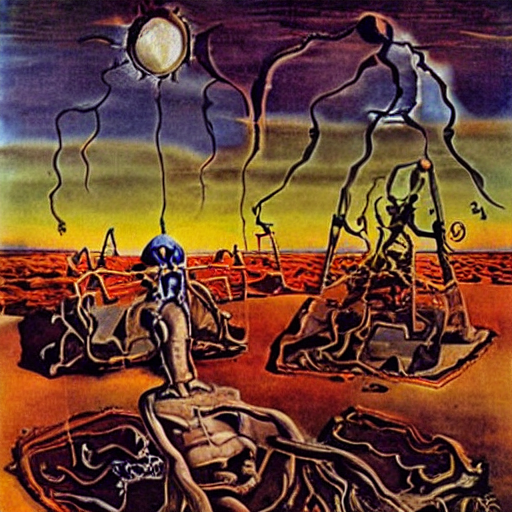

once was green now a desolate scene, not a blade of vegetation Dali surrealist 2


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

2 once was green now a desolate scene, not a blade of vegetation Dali surrealist


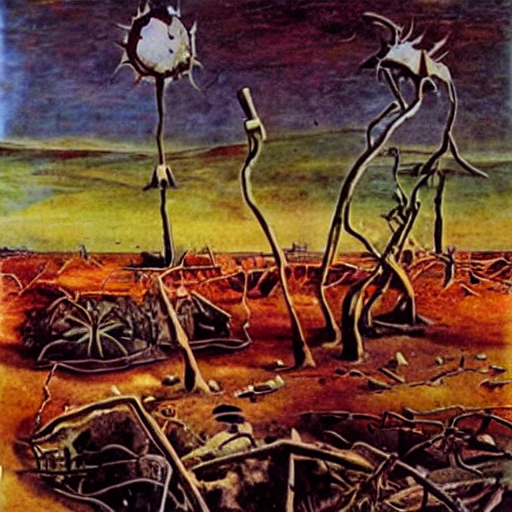

cutting down tree anywhere you please, is really human nature?  Dali surrealist 3


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 cutting down tree anywhere you please, is really human nature?  Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

3 cutting down tree anywhere you please, is really human nature?  Dali surrealist


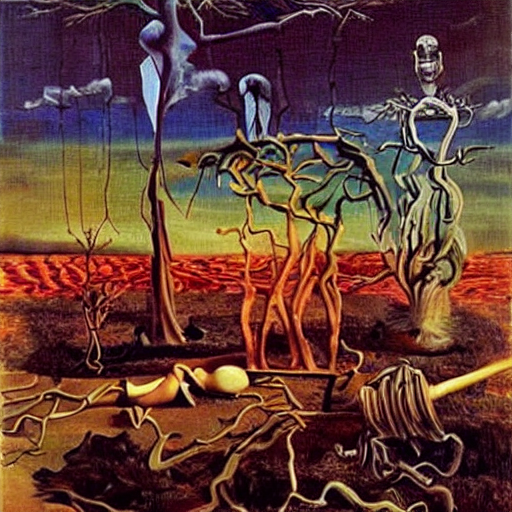

The heat is on, As the desert moves on, in world of mass migration Dali surrealist 4


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 The heat is on, As the desert moves on, in world of mass migration Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

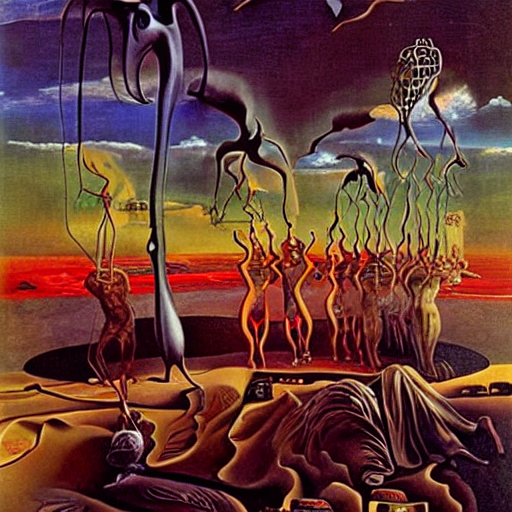

Floods and storms, Setting up new norms, Butterfly wing causation Dali surrealist 5


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

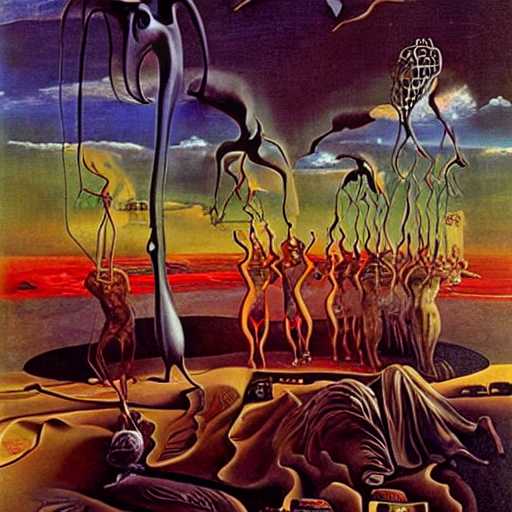

Hurricanes blow and the night skies glow, In a primal scream of nature, Dali surrealist 6


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 Hurricanes blow and the night skies glow, In a primal scream of nature, Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

3 Hurricanes blow and the night skies glow, In a primal scream of nature, Dali surrealist


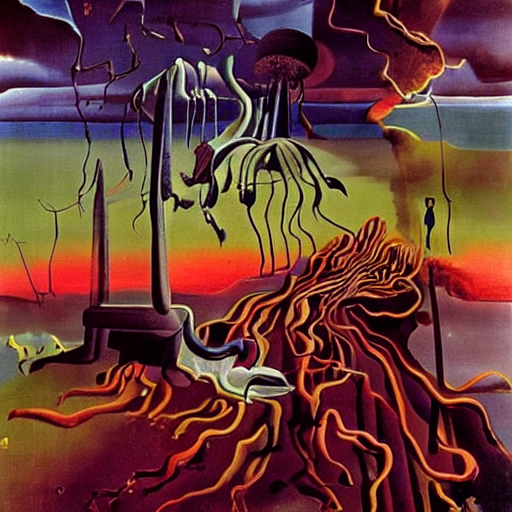

You never walked in the wasteland, You never came face to face, man Dali surrealist 7


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 You never walked in the wasteland, You never came face to face, man Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

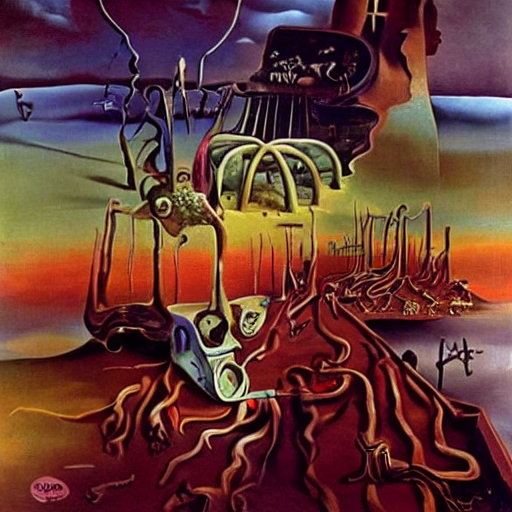

Bur I knew, well all knew... you knew too Dali surrealist 8


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

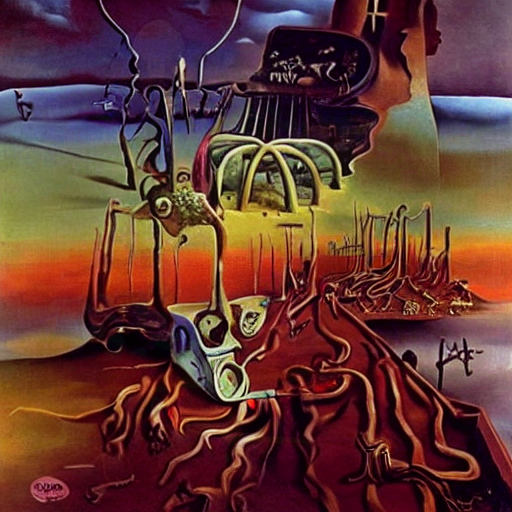

Electric cars, Never getting too far, In a green revolution Dali surrealist 9


  0%|          | 0/25 [00:00<?, ?it/s]

0 Electric cars, Never getting too far, In a green revolution Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

2 Electric cars, Never getting too far, In a green revolution Dali surrealist


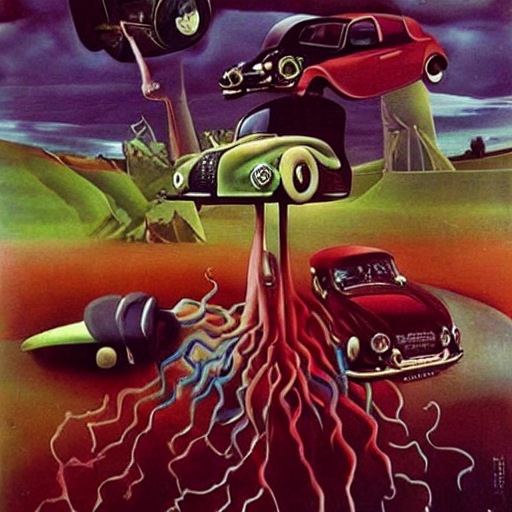

SpaceX guy, Putting rockets in the sky, Spilling out more pollution Dali surrealist 10


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 SpaceX guy, Putting rockets in the sky, Spilling out more pollution Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

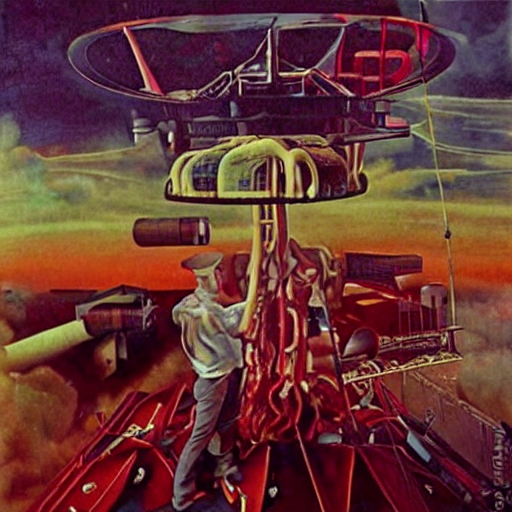

Will getting on a plane, ever feel the same, When you stop and think about the future? Dali surrealist 11


  0%|          | 0/25 [00:00<?, ?it/s]

0 Will getting on a plane, ever feel the same, When you stop and think about the future? Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

2 Will getting on a plane, ever feel the same, When you stop and think about the future? Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

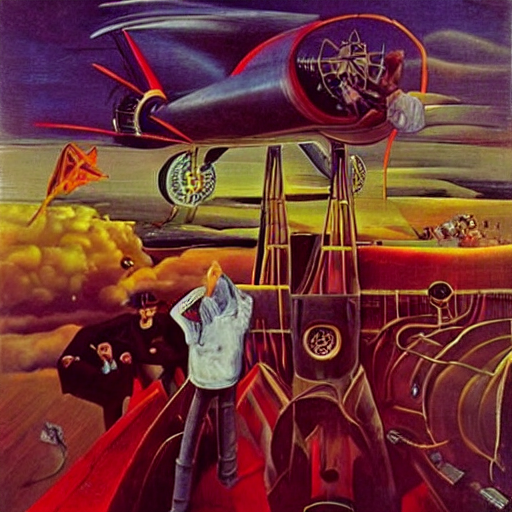

What a good day, For the prophets to say, The levels of the seas are rising Dali surrealist 12


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

2 What a good day, For the prophets to say, The levels of the seas are rising Dali surrealist


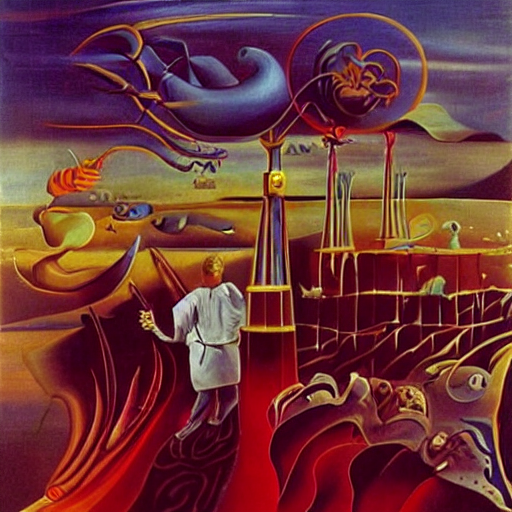

Does anyone care, When they're blowing hot air?, Is anyone compromising? Dali surrealist 13


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 Does anyone care, When they're blowing hot air?, Is anyone compromising? Dali surrealist


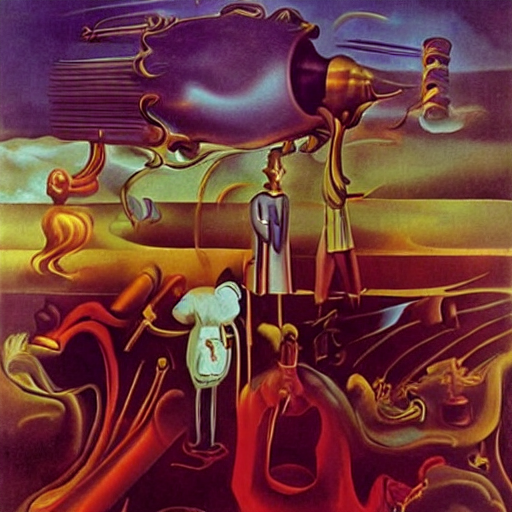

When it's hotter each day our children pay, With a volatile mixed-up future Dali surrealist 14


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

1 When it's hotter each day our children pay, With a volatile mixed-up future Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

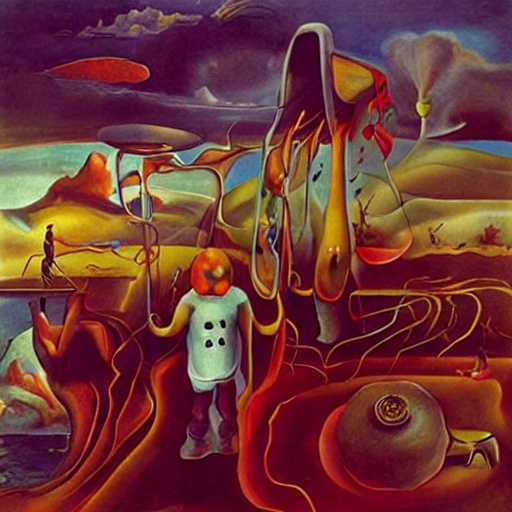

You never walked in the wasteland, You never came face to face, man Dali surrealist 15


  0%|          | 0/25 [00:00<?, ?it/s]

0 You never walked in the wasteland, You never came face to face, man Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

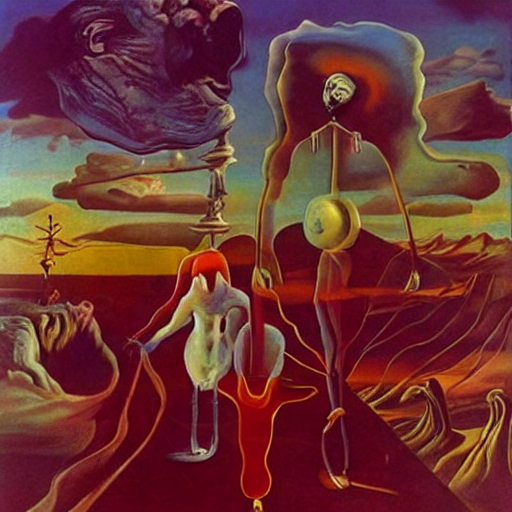

Bur I knew, well all knew... you knew too Dali surrealist 16


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

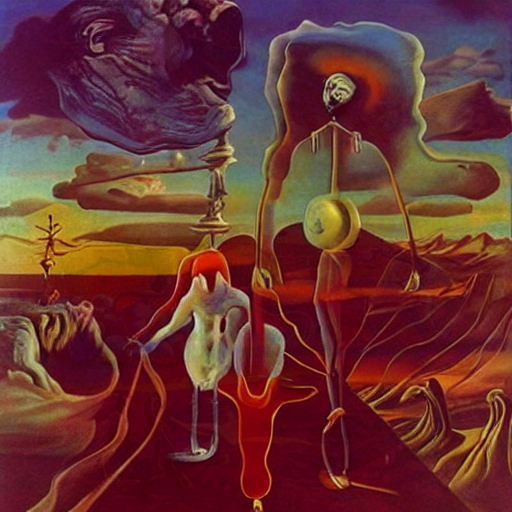

Wasteland Dali surrealist 17


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

6 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

8 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

10 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

12 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

14 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

16 Wasteland Dali surrealist


  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

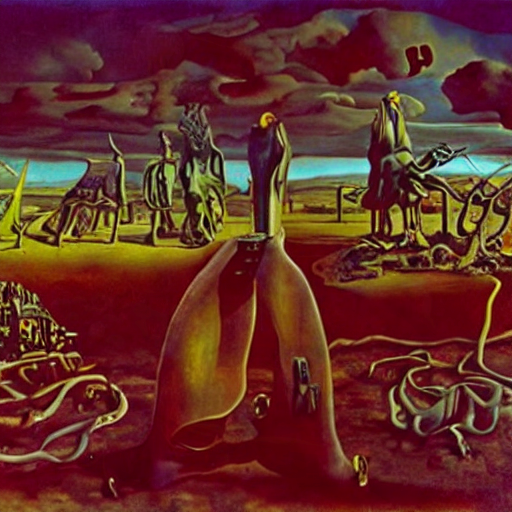

In [7]:
movie = makeVideo(fn='Wasteland.xlsx')

In [ ]:
a,b = loadController(fn = 'Wasteland.xlsx')
b

In [ ]:
#fn = 'Dali_Bright2'
#style = 'surreal Dali bright psychedelic colours'
#zoom = True

#prompts = [["a strange landscape", 20],
#           ["a house in a landscape",20],
#           ["a front door ",10],
#           ["a long corridor",10],
#           ["pictures in an art gallery",20],
#           ['a Dali picture on a wall',10],
#           ["a strange landscape, animals with long legs",10]
                      ]
#negative_prompt = 'text'
#nInsert,nFade = 0,40


In [ ]:
fn = 'Wasteland4'
style = 'surreal Dali'
zoom = False

prompts = [ 
      ['Wasteland',8],
      ["the sun went down on a barren on town, just a grave of degradation", 3],
      ["once was green now a desolate scene, not a blade of vegetation",3],
      ["cutting down tree anywhere you please, is really human nature? ",4],
      ['The heat is on, As the desert moves on, in world of mass migration',3],
      ['Floods and storms, Setting up new norms, Butterfly wing causation',3],
      ['Hurricanes blow and the night skies glow, In a primal scream of nature,',4],
      ['You never walked in the wasteland, You never came face to face, man',5],
      ['Bur I knew, well all knew... you knew too',4],
      ['Electric cars, Never getting too far, In a green revolution',3],
      ['SpaceX guy, Putting rockets in the sky, Spilling out more pollution',3],
      ['Will getting on a plane, ever feel the same, When you stop and think about the future?',4],
      ['What a good day, For the prophets to say, The levels of the seas are rising',3],
      ["Does anyone care, When they're blowing hot air?, Is anyone compromising?",2],
      ["When it's hotter each day our children pay, With a volatile mixed-up future",5],
      ['You never walked in the wasteland, You never came face to face, man',5],
      ['Bur I knew, well all knew... you knew too',5],
      ['Wasteland',20]
    ]

negative_prompt = 'pink, red'


nFade=40
nInsert=0

In [ ]:
fn = 'WaveCafe2'
style =  'Paul Cézanne impressionism'
zoom = True

prompts = [
        ["Mediterranean seascape, sunshine",4],
        ["Mediterranean coastline, blue sea, sunshine",7],
        ["Road in Provence countryside, lavender",8],
        ["Road in a pine forest",7],
        ["Landscape view of mountains saint victoire",15],
        ["Road in a pine forest",9],
        ["Road in Provence countryside, lavender",7],
        ["Mediterranean coastline, blue sea, sunshine",8],
        ["Mediterranean seascape, sunshine",8],
        ]
negative_prompt = 'text'

nFade=80
nInsert=0

In [ ]:
movie = create(fn,prompts,style,negative_prompt,zoom,nInsert,nFade)

In [ ]:
#with open(path/f'{fn}_Keyframes.pkl','rb') as f:
#  movie = pickle.load(f)
#nFade = 40
#nInsert=0
#movie = fadeMovie(movie,nFade)
#saveVideo(path/f'{fn}_nFade{nFade}',movie)